In [1]:
import numpy as np
import pandas as pd
import os
import tqdm

In [2]:
dat1 = np.load("gathered_k_runs.pkl", allow_pickle=True)
dat2 = np.load("gathered_data.pkl", allow_pickle=True)
combined_df = pd.concat([dat1, dat2], ignore_index=True)
combined_df.to_pickle("final.pkl")  

In [3]:
folder = "data/processed/"
focus = "all"

def gather_data(folder, focus):
    data_loc = folder + focus
    files = os.listdir(data_loc)
    files = filter(lambda x: (len(x) > 4) and (".csv" == x[-4:]), files)
    files = map(lambda x: data_loc + '/' + x, files)
    files = map(pd.read_csv, files)
    return pd.concat(files).reset_index(drop = True)

#df_data = gather_data(folder, focus)
df_data = np.load("final.pkl", allow_pickle=True)

In [9]:
df_data.describe()

df_data[df_data["k"] == 4].describe()


,c,k,n,p,zeta,analytical_sigma_cont,kuramoto_euler_sigma_squared_all,kuramoto_euler_sigma_squared_1000,kuramoto_euler_sigma_squared_100,kuramoto_euler_sigma_squared_10,ou_euler_sigma_squared_all,ou_euler_sigma_squared_1000,ou_euler_sigma_squared_100,ou_euler_sigma_squared_10
count,86400.00000,86400.0,86400.0,86400.000000,86400.000000,86400.000000,86400.000000,86400.000000,86400.000000,86400.000000,86400.000000,86400.000000,86400.000000,86400.000000
mean,0.45000,4.0,100.0,0.203267,0.275000,0.401608,0.828875,0.865120,0.881752,0.884136,0.408750,0.404504,0.399683,0.398758
std,0.22913,0.0,0.0,0.259123,0.114565,0.611570,0.887382,0.910483,0.938117,0.948715,0.637409,0.645196,0.657212,0.660237
min,0.10000,4.0,100.0,0.007000,0.100000,0.006951,0.007016,0.006966,0.006644,0.005693,0.006972,0.006923,0.006607,0.005664
25%,0.27500,4.0,100.0,0.019000,0.187500,0.077398,0.118406,0.120702,0.119951,0.117479,0.078101,0.077516,0.075856,0.074891
50%,0.45000,4.0,100.0,0.078000,0.275000,0.194466,0.392827,0.419872,0.419813,0.414646,0.196227,0.194380,0.189700,0.186025
75%,0.62500,4.0,100.0,0.317000,0.362500,0.460697,1.436220,1.538692,1.558662,1.549715,0.465677,0.458091,0.444352,0.438190
max,0.80000,4.0,100.0,0.905000,0.450000,6.829102,3.162458,3.164634,3.240159,3.417749,13.274520,13.132776,17.739839,16.284444


In [7]:
id_col = ("p", "zeta", "c", "k")
df_data_clean = pd.DataFrame(index = df_data.index)
for i in id_col:
    df_data_clean[i] = df_data[i]
df_data_clean["analytical_sigma_continuous"] = df_data["analytical_sigma_cont"]
df_data_clean["kuramoto_sigma_squared"] = df_data["kuramoto_euler_sigma_squared_all"]
df_data_clean["linear_sigma_squared"] = df_data["ou_euler_sigma_squared_all"]

In [8]:
REL_ERR = lambda df, Measured_Label, True_Label: abs(df[Measured_Label] - df[True_Label]) / df[True_Label]

id_col = ("p", "zeta", "c")

def proc_data(df_data, id_col):

    err_data = pd.DataFrame(index=df_data.index)

    for label in id_col:
        err_data[label] = df_data[label]
    err_data["sigma_relative_error_continuous"] = REL_ERR(df_data, "analytical_sigma_continuous", "linear_sigma_squared")
    err_data["empirical_relative_error_linear_kuramoto"] = REL_ERR(df_data, "linear_sigma_squared", "kuramoto_sigma_squared")
    err_data["sigma_relative_error_continuous_kuramoto"] = REL_ERR(df_data, "analytical_sigma_continuous", "kuramoto_sigma_squared")
    err_data["sigma_continuous_analytic_real"] = df_data["analytical_sigma_continuous"]
    err_data["sigma_continuous_kuramoto_real"] = df_data["kuramoto_sigma_squared"]


    err_data_mean = err_data.groupby(list(id_col)).mean()
    err_data_names = err_data_mean.columns
    err_data_mean = err_data_mean.reset_index(drop = False)
    return err_data_mean, err_data

err_data_mean, err_data = proc_data(df_data_clean, id_col)

In [9]:
display(err_data_mean.describe())
display(err_data_mean.head())

,p,zeta,c,sigma_relative_error_continuous,empirical_relative_error_linear_kuramoto,sigma_relative_error_continuous_kuramoto,sigma_continuous_analytic_real,sigma_continuous_kuramoto_real
count,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000,960.000000
mean,0.203267,0.275000,0.450000,0.027460,0.320671,0.327491,0.278378,0.750641
std,0.259257,0.114624,0.229248,0.026204,0.215185,0.217037,0.382122,0.752316
min,0.007000,0.100000,0.100000,0.003846,0.006217,0.010559,0.006634,0.006707
25%,0.019000,0.187500,0.275000,0.006125,0.112638,0.116644,0.061035,0.136331
50%,0.078000,0.275000,0.450000,0.016218,0.322284,0.330434,0.152505,0.485790
75%,0.317000,0.362500,0.625000,0.044148,0.522523,0.530776,0.329862,1.193158
max,0.905000,0.450000,0.800000,0.130895,0.765719,0.766264,3.193867,2.821479


,p,zeta,c,sigma_relative_error_continuous,empirical_relative_error_linear_kuramoto,sigma_relative_error_continuous_kuramoto,sigma_continuous_analytic_real,sigma_continuous_kuramoto_real
0,0.007,0.1,0.1,0.125539,0.589210,0.611600,0.156184,1.408193
1,0.007,0.1,0.2,0.089330,0.559497,0.587232,0.078370,1.387614
2,0.007,0.1,0.3,0.074856,0.609209,0.631444,0.052205,1.512223
3,0.007,0.1,0.4,0.068890,0.572127,0.595934,0.038947,1.383001
4,0.007,0.1,0.5,0.061836,0.652555,0.671499,0.031413,1.590471


In [10]:
import matplotlib.pyplot as plt

#df should be prepivoted and filtered
def graph_diff(df, plt_name, splt_name_func, err_data_names, min_max = None, nfi = None, col_ind = ("x", "y"), size = (2, 2)):
    err_data_names = df.columns
    fig, axes = plt.subplots(nrows=size[0], ncols=size[1])
    fig.suptitle(plt_name)
    
    fig.set_size_inches(20, 10)
    fig.subplots_adjust(top=0.95)
    
    if min_max is None and nfi is not None:
        cmax = df[nfi.keys()].max().max()
        cmin = df[nfi.keys()].min().min()
    else:
        cmax = min_max[1]
        cmin = min_max[0]

    for name_index in range(len(axes.flat)):
        if name_index >= len(err_data_names):
            ax = axes.flat[name_index]
            ax.axis('off')
            continue
        if nfi is not None:
            if name_index >= len(nfi):
                ax = axes.flat[name_index]
                ax.axis('off')            
                continue
            name = list(nfi.keys())[name_index]
        else:
            name = list(err_data_names)[name_index]
        df_p = df[name]
        #display(df_p)
        np_a = df_p.to_numpy()
        ax = axes.flat[name_index]

        x_t = df_p.columns.to_numpy()
        y_t = df_p.index.to_numpy()
        ax.set_xticks(np.arange(0, len(x_t)), labels=x_t)
        ax.set_yticks(np.arange(0, len(y_t)), labels=y_t)

        plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
            rotation_mode="anchor")
        ax.set_title(splt_name_func(name))
        ax.set_ylabel(df_p.index.names[0])
        ax.set_xlabel(df_p.columns.names[0])

        im = ax.imshow(np_a,interpolation="gaussian", cmap="jet", vmin=cmin, vmax=cmax)
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    cbar = fig.colorbar(im, cax=cbar_ax, fraction=0.046, pad=0.04, shrink = 0.7)
    cbar.ax.set_ylabel("value", rotation=-90, va="bottom")

    plt.show()

    print("\n" * 10)

In [11]:
def plot_kss_asc(dat_sub, var, disc = "k"):
    fig = plt.figure()
    ax = plt.axes()
    
    # Get unique categories and assign a color to each
    unique_categories = np.sort(dat_sub[disc].unique())
    colors = plt.cm.viridis(np.linspace(0, 1, len(unique_categories)))

    # Create a color mapping
    category_color_map = dict(zip(unique_categories, colors))

    # Create the scatter plot with mapped colors
    scatter = ax.scatter(
        dat_sub["linear_sigma_squared"], 
        dat_sub["analytical_sigma_continuous"], 
        c=dat_sub[disc].map(category_color_map),  # Map colors based on category
        alpha=0.4
    )

    plt.xlabel(r'$\langle \sigma^2 \rangle$')
    plt.ylabel(r'Analytical $\sigma^2 $')
    plt.title(r'$\langle \sigma^2 \rangle$' + " vs " + r'Analytical $\sigma^2 $' + " for " + var)
    
    # Optional: Add a reference line
    x = np.linspace(0, np.pi, 2)
    ax.plot(x, x, color='green')

    # Create legend handles
    handles = [plt.Line2D([0], [0], marker='o', color='w', 
                           markerfacecolor=category_color_map[cat], markersize=10) 
               for cat in unique_categories]

    plt.legend(handles, unique_categories, title=disc)

    # Show the plot
    plt.grid()
    plt.show()


In [12]:
def plot_kss_asc_all(dat_sub, id_col, var):
    disc_set = list(set(id_col) - set([var]))  # Ensure to use columns from dat_sub
    
    # Get unique categories for var
    unique_categories = np.sort(dat_sub[var].unique())
    
    # Create subplots with enough rows and columns
    num_rows = len(unique_categories)
    num_cols = len(disc_set)

    # Set base figure size parameters
    base_width = 5  # Width of each subplot
    base_height = 6  # Height of each subplot
    
    # Calculate figsize
    figsize = (base_width * num_cols, base_height * num_rows)
    fig, axs = plt.subplots(num_rows, num_cols, figsize=figsize)

    for i_ind, category in enumerate(unique_categories):
        for d_ind, disc in enumerate(disc_set):
            # Filter data for the current category
            filtered_data = dat_sub[dat_sub[var] == category]
            
            # If there is no data for the current category and disc, skip this iteration
            if filtered_data.empty:
                axs[i_ind, d_ind].axis('off')  # Hide the axes
                continue
            
            # Create a color mapping based on the disc variable
            unique_disc_values = np.sort(filtered_data[disc].unique())

            COLOUR_MAP_LIST = [plt.cm.viridis,plt.cm.plasma,plt.cm.inferno,plt.cm.cividis]

            cm_func = COLOUR_MAP_LIST[d_ind]

            #cm_func = plt.cm.verdis
            
            colors = cm_func(np.linspace(0, 1, len(unique_disc_values)))
            disc_color_map = dict(zip(unique_disc_values, colors))

            # Create scatter plot colored by disc variable
            scatter = axs[i_ind, d_ind].scatter(
                filtered_data["linear_sigma_squared"], 
                filtered_data["analytical_sigma_continuous"], 
                c=filtered_data[disc].map(disc_color_map),  # Map colors based on disc
                alpha=0.8
            )

            axs[i_ind, d_ind].set_xlabel(r'$\langle \sigma^2 \rangle$')
            axs[i_ind, d_ind].set_ylabel(r'Analytical $\sigma^2 $')
            title = r'$\langle \sigma^2 \rangle$ vs Analytical $\sigma^2$ for {} = {}'
            title = title.format(var, category)
            if d_ind == (len(disc_set) - 1) // 2:
                axs[i_ind, d_ind].set_title(title)

            # Optional: Add a reference line
            x = np.linspace(0, np.pi, 2)
            axs[i_ind, d_ind].plot(x, x, color='green')

            # Create legend handles for unique values in disc
            handles = [plt.Line2D([0], [0], marker='o', color='w', 
                                   markerfacecolor=disc_color_map[val], markersize=10) 
                       for val in unique_disc_values]

            axs[i_ind, d_ind].legend(handles, unique_disc_values, title=disc)

            # Show the grid for better visibility
            axs[i_ind, d_ind].grid()

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()


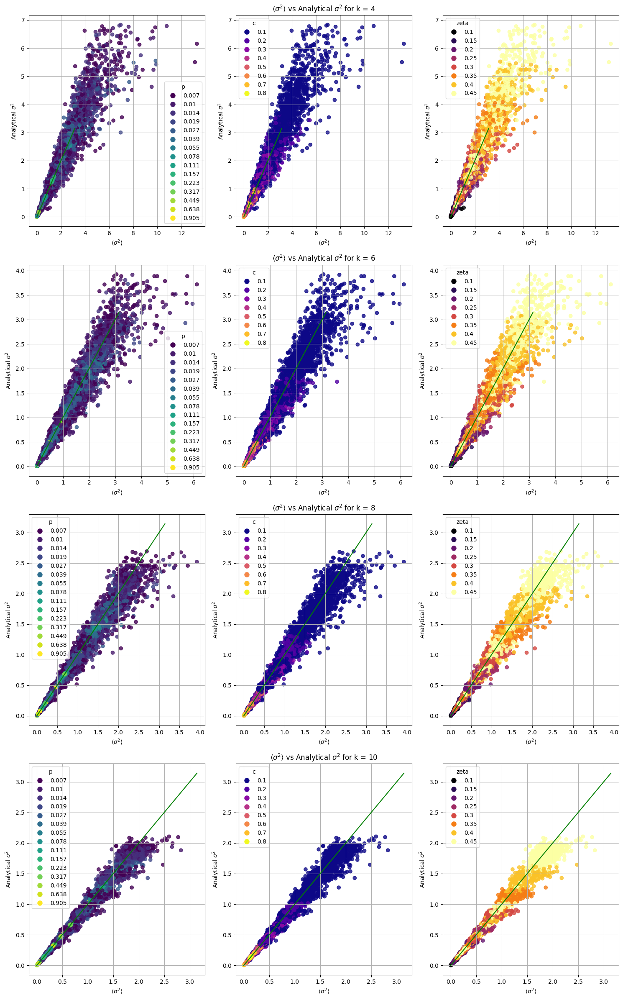

In [13]:
plot_kss_asc_all(df_data_clean, id_col, var = "k")


# K = 4

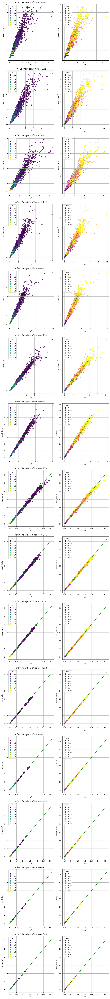

In [14]:
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 4], set(id_col) - {"k"}, var = "p")


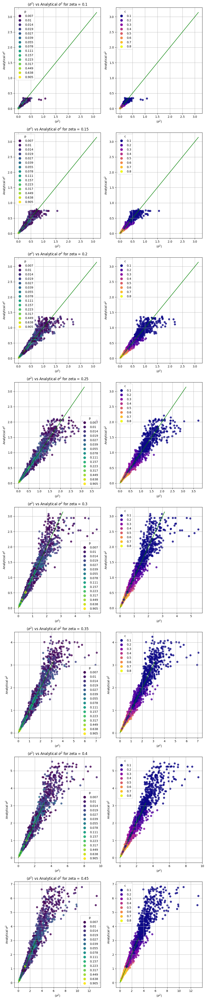

In [15]:
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 4], set(id_col) - {"k"}, var = "zeta")


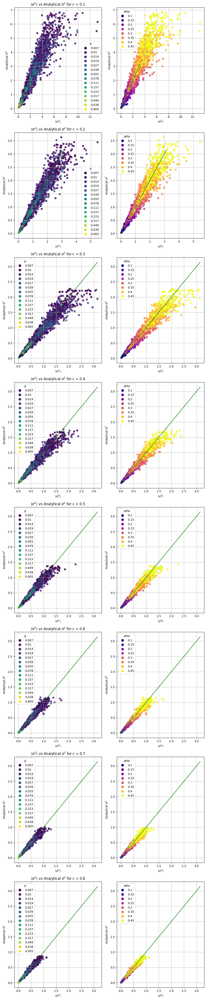

In [16]:
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 4], set(id_col) - {"k"}, var = "c")


# K = 6

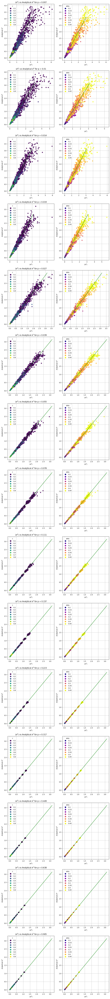

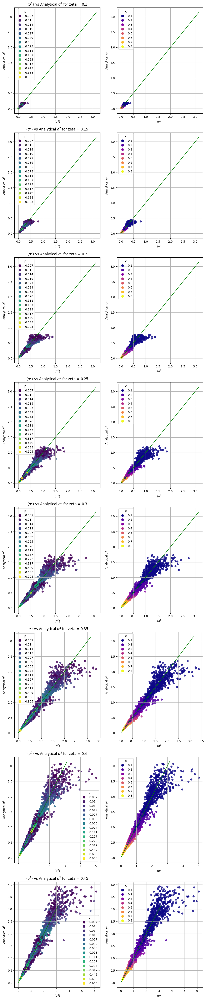

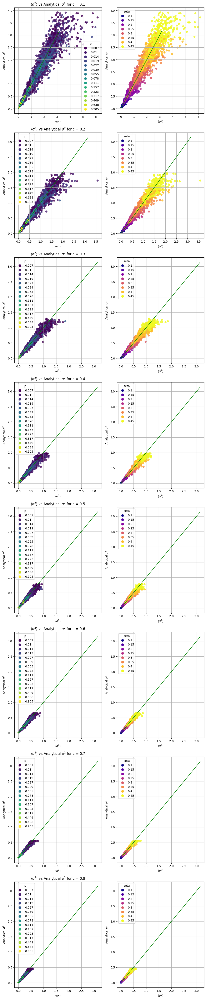

In [17]:
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 6], set(id_col) - {"k"}, var = "p")
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 6], set(id_col) - {"k"}, var = "zeta")
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 6], set(id_col) - {"k"}, var = "c")

# K = 8

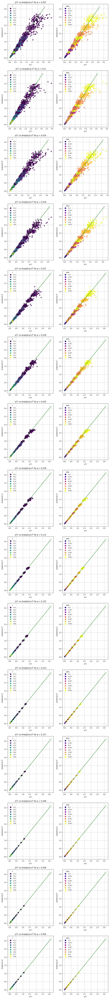

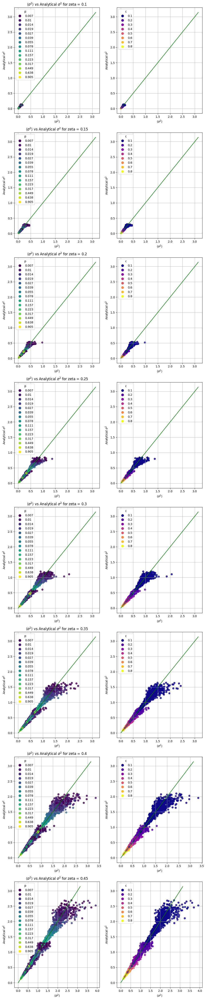

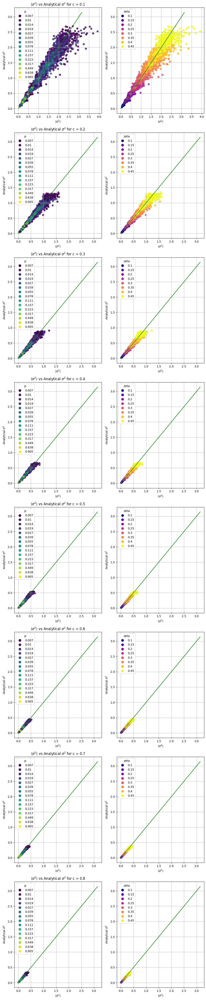

In [18]:
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 8], set(id_col) - {"k"}, var = "p")
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 8], set(id_col) - {"k"}, var = "zeta")
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 8], set(id_col) - {"k"}, var = "c")

# K = 10

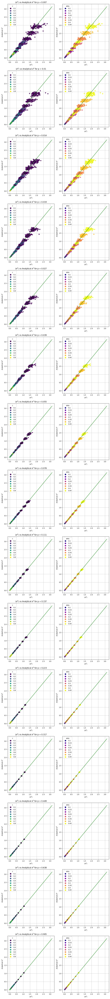

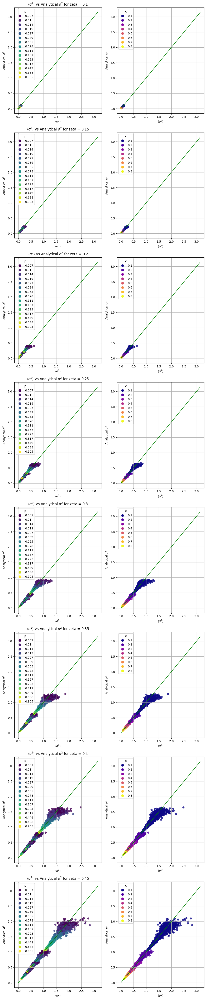

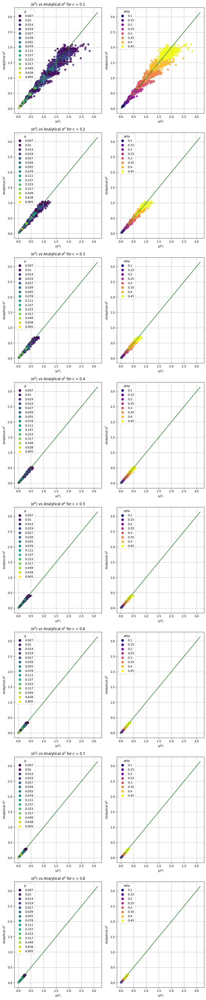

In [19]:
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 10], set(id_col) - {"k"}, var = "p")
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 10], set(id_col) - {"k"}, var = "zeta")
plot_kss_asc_all(df_data_clean[df_data_clean["k"] == 10], set(id_col) - {"k"}, var = "c")